# Class 01 : 다변수 함수


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import sympy as sp

style_name = 'bmh' #bmh
mpl.style.use(style_name)
np.set_printoptions(precision=4, linewidth =150)

style = plt.style.library[style_name]
style_colors = [ c['color'] for c in style['axes.prop_cycle'] ]

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
from IPython.core.display import display, HTML

init_notebook_mode(connected=True)

# https://github.com/plotly/plotly.py/issues/515
# The polling here is to ensure that plotly.js has already been loaded before
# setting display alignment in order to avoid a race condition.
display(HTML(
    '<script>'
        'var waitForPlotly = setInterval( function() {'
            'if( typeof(window.Plotly) !== "undefined" ){'
                'MathJax.Hub.Config({ SVG: { font: "STIX-Web" }, displayAlign: "center" });'
                'MathJax.Hub.Queue(["setRenderer", MathJax.Hub, "SVG"]);'
                'clearInterval(waitForPlotly);'
            '}}, 250 );'
    '</script>'
))

## 다변수-실함수multivariable scalar function

- 입력이 여러개, 출력이 하나인 함수로 예를 들어 입력이 2개이고 출력이 하나인 함수는 다음처럼 표시할 수 있음.

- $z = f(x, y)  \qquad f:\mathbb{R}^2 \to \mathbb{R}$

- 가장 자주 보게 될 함수

- 출력이 스칼라이기 때문에 이런 종류의 함수는 스칼라장<sup>scalar field</sup>를 정의한다고 말한다.

- 공간의 온도장(온도분포), 대기의 기압장(기압분포), 하지만 우리는 물리적 의미는 생각하지 않음


- 예를 들면 다음과 같음 함수들이 있을 수 있다.
    - $f(\mathbf{x}) = f(x_1, x_2) = 2x_1 + 3x_2 - x^{3}_{1} - 2x^{2}_{2} $ 
    - 공간에서의 유클리드 거리 $f(\mathbf{p};\mathbf{p}_0) = f(x,y,z;x_0,y_0,z_0) = \sqrt{(x-x_0)^2 + (y-y_0)^2 + (z-z_0)^2}$     
    
    
- #### [참고] 매개변수 표기법 : $f(\mathbf{p};\mathbf{p}_0)$에서 ; 뒤쪽에 적는 부분은 이 함수를 구성하기위해 필요한 매개변수를 나타낸다. 
    - 위처럼 어떤 점 $\mathbf{p}$를 입력했을 때 거리를 계산해서 출력하려면 어떤 점으로부터 거리를 계산할 것인지 기준점이 필요한데 이 기준점은 함수를 정의할 때 정해주어야 한다. 
    - 그렇게 함수를 목적에 맞게 정의하기 위해 지정해주는 변수를 표현하는 표기법이다.
    
    
- 우리에게 가장 중요한 예는 **목적함수<sup>objective function</sup>** 또는 **코스트함수<sup>cost function</sup>**라고 불리는 함수들

- 아래 보이는 함수는 선형회귀에 나오는 대표적인 목적함수

$$
C(\mathbf{w}) = \frac{1}{2N} \sum_{i=1}^{N} \lVert y(\mathbf{w};\mathbf{x}_i) - t_i \rVert^2
$$

- 위 함수에서 입력변수는 무엇인지 매개변수는 무엇인지 잘 생각해보자.

- 매개변수를 명확하게 표시해서 적으면 다음과 같이 쓸 수 있다.

$$
C(\mathbf{w}; \mathbf{x}_1, \mathbf{x}_2, \dots, \mathbf{x}_N, t_1, t_2, \dots, t_N)
$$

- 여기서 $\mathbf{w}$는 함수 $C$의 입력변수가 되고 나머지 $\mathbf{x}_1, \mathbf{x}_2, \dots, \mathbf{x}_N, t_1, t_2, \dots, t_N$는 매개변수

### 등고선 플로팅<sup>[jakevdp]</sup>

- $n$ 변수 실함수를 평면상에 그려보자.

- <span class="code-body">numpy.meshgrid</span>을 이용해서 $xy$평면에 적절히 그리드를 생성

```python
x = np.linspace(0, 1, 5)
y = np.linspace(0, 1, 5)
X, Y = np.meshgrid(x, y)

print(X)
[[ 0.    0.25  0.5   0.75  1.  ]
 [ 0.    0.25  0.5   0.75  1.  ]
 [ 0.    0.25  0.5   0.75  1.  ]
 [ 0.    0.25  0.5   0.75  1.  ]
 [ 0.    0.25  0.5   0.75  1.  ]]
 
print(Y)
[[ 0.    0.    0.    0.    0.  ]
 [ 0.25  0.25  0.25  0.25  0.25]
 [ 0.5   0.5   0.5   0.5   0.5 ]
 [ 0.75  0.75  0.75  0.75  0.75]
 [ 1.    1.    1.    1.    1.  ]]
 ```
 
 - 위 상태에서 `X[0,0`], `Y[0,0]`는 (0,0), `X[0,1]`, `Y[0,0]`는 (0.25, 0)이 되는 식으로 구성

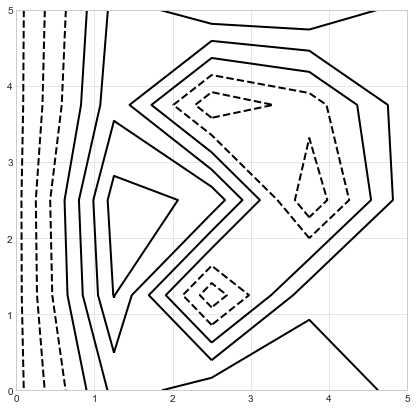

In [14]:
plt.figure(figsize=(7,7))
plt.style.use('seaborn-whitegrid')

# 2변수 실함수를 정의
def f(x,y):
    return np.sin(x) ** 10 + np.cos(10 + y * x) * np.cos(x)

x = np.linspace(0, 5, 5)
y = np.linspace(0, 5, 5)

# [0,5]x[0,5] 영역을 생성
X, Y = np.meshgrid(x, y)

# 리턴되는 Z도 X, Y와 같은 shape을 가짐
Z = f(X, Y)

# 흑백 그림에서 음의 값은 점선으로 표시
plt.contour(X, Y, Z, colors='black')

plt.show()

In [17]:
Z


array([[-0.8391,  0.3278,  0.6781,  0.6922,  0.4194],
       [-0.8391,  0.7617, -0.6735,  0.4328,  0.4144],
       [-0.8391,  0.8598,  0.6922, -0.7061,  0.4097],
       [-0.8391,  0.4275, -0.6872, -0.3901,  0.4052],
       [-0.8391,  0.3222,  0.7055,  0.7332,  0.4011]])

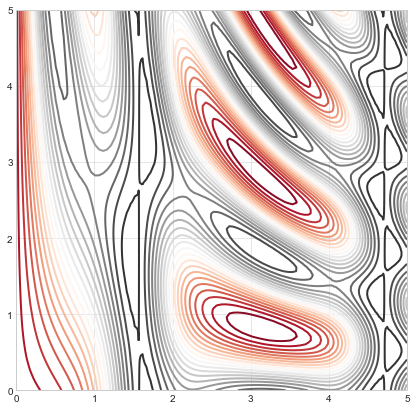

In [5]:
plt.figure(figsize=(7,7))

# 등고선을 위한 level을 20개로 컬러맵을 RedGray로
plt.contour(X, Y, Z, 20, cmap='RdGy')

plt.show()

- 2차원 평면에 등고선으로 그리지 말고 3차원 그래프를 이용하여 다음 함수를 실제로 그려 보자.

$$
-\frac{x_1+x_2}{2+ \cos(x_1) \sin(x_2)} + 12
$$


In [6]:
x1 = np.linspace(0, 5, 200)
x2 = np.linspace(0, 10, 400)
X1, X2 = np.meshgrid(x1,x2)

In [7]:
X1

array([[0.    , 0.0251, 0.0503, ..., 4.9497, 4.9749, 5.    ],
       [0.    , 0.0251, 0.0503, ..., 4.9497, 4.9749, 5.    ],
       [0.    , 0.0251, 0.0503, ..., 4.9497, 4.9749, 5.    ],
       ...,
       [0.    , 0.0251, 0.0503, ..., 4.9497, 4.9749, 5.    ],
       [0.    , 0.0251, 0.0503, ..., 4.9497, 4.9749, 5.    ],
       [0.    , 0.0251, 0.0503, ..., 4.9497, 4.9749, 5.    ]])

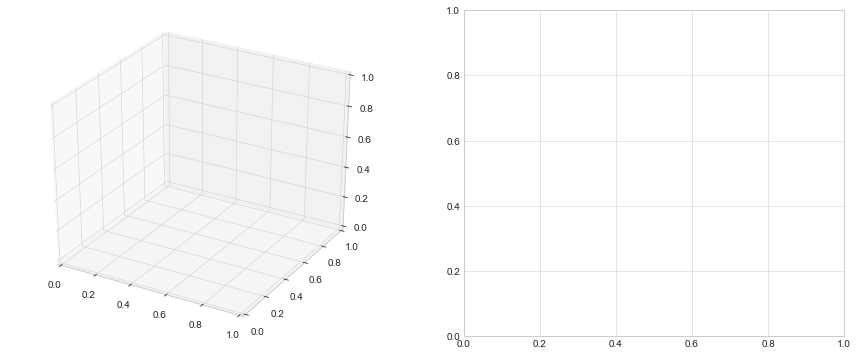

In [18]:
from mpl_toolkits.mplot3d import Axes3D

mpl.style.use('seaborn-whitegrid')


# 데이터 준비
x1 = np.linspace(0, 5, 200)
x2 = np.linspace(0, 10, 400)
X1, X2 = np.meshgrid(x1,x2)

def multivari_func(X1, X2) :
    Z = -(X1+X2)/(2+np.cos(X1)*np.sin(X2)) + 12
    return Z

Z = multivari_func(X1, X2)

fig = plt.figure(figsize=(15,6))

Z_level = np.ones_like(Z)*15

#####################################
# 여기 3차원 그래프를 그려보세요.
ax1 = fig.add_subplot(121, projection='3d')




#####################################
# 여기 등고선 그래프를 그려보세요.
ax2 = fig.add_subplot(122)




plt.show()
mpl.style.use(style_name)


- 위 그래프에서 왼쪽 그래프는 $(x_1, x_2)$로 계산된 $f(x_1, x_2)$를 수직축(높이값)에 그린 것

- 오른쪽 그래프는 왼쪽 그래프에서 특정 높이를 만족하는 값만을 모아서 $x_1 x_2$ 평면에 그린것

- 오른쪽 그래프는 등고선이 되며 선에 함수값이 적혀 있음

- 마치 지도 등고선에 고지 높이가 적혀있는 것과 같음

- plotly가 설치되어 있다면 다음 코드로 인터렉티브하게 등고선 그림을 볼 수 있다.

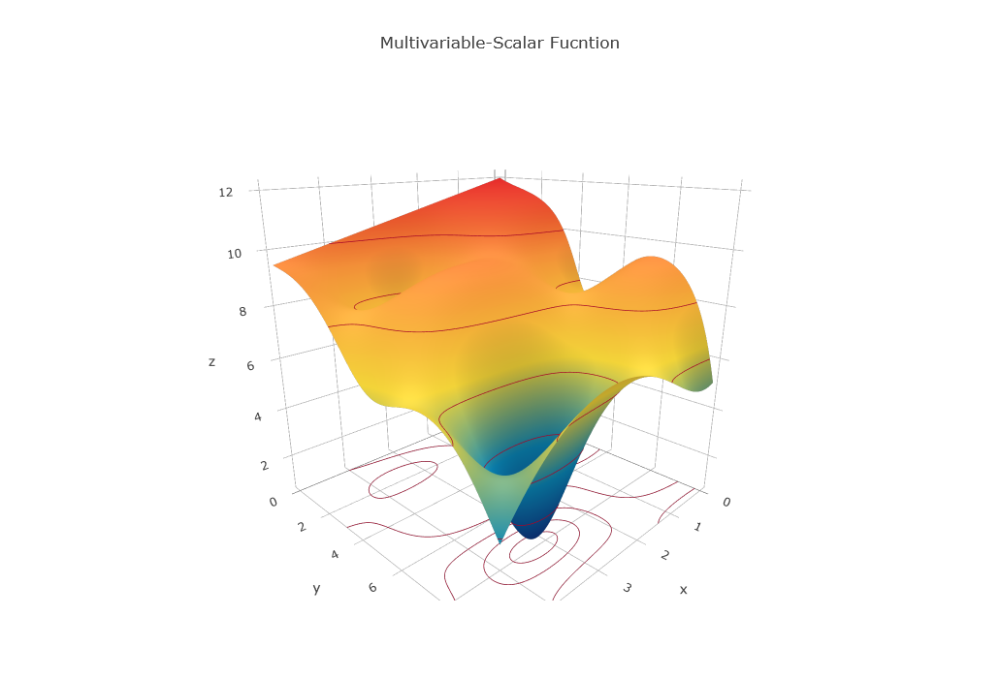

In [9]:
# https://plot.ly/python/
# https://plot.ly/python/offline/
# https://plot.ly/python/3d-surface-coloring/
# https://plot.ly/~empet/14521/contour-lines-on-a-surface-and-their-pro/#/
# hover contour off
# https://community.plot.ly/t/trace-lines-appearing-on-hover/5801

axis = dict(
            showbackground  = True, 
            backgroundcolor = "rgb(230, 230, 230)",
            gridcolor       = "rgb(255, 255, 255)",      
            zerolinecolor   = "rgb(255, 255, 255)",  
       )

data = [
    go.Surface(x=X1, y=X2, z=Z, showscale=False, colorscale='Portland', 
               opacity=1.0, hoverinfo='x+y+z',
               contours=dict(
                   x=dict(highlight=False, show=False, ), 
                   y=dict(highlight=False, show=False, ),
                   z=dict(highlight=True,  show=True, color='#a60628', highlightcolor='#0072b2', 
                          highlightwidth=5, project=dict(z=True), )
               ),
    ),
]

layout = go.Layout(
    title='Multivariable-Scalar Fucntion',
    autosize=True,
    width=700, height=700,
    scene=dict(camera=dict(eye=dict(x=1.25, y=1.25, z=0.6)), 
               xaxis=dict(showspikes=False),
               yaxis=dict(showspikes=False),
               zaxis=dict(showspikes=True, spikecolor='#0072b2', spikesides=False),
               aspectratio=dict(x=1, y=1, z=1),
          )
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

#### 한쪽 변이 숫자로 고정되면? $f(x,y) = c$<sup>[wiki:음함수,양함수]</sup>

- $y=f(x)$ : 종속변수 없이 독립변수들의 식만으로 표현되는 함수 
    - 입력과 출력이 명확히 구분


- $f(x,y) = c$ : 종속변수가 독립변수와 분리되지 않은 하나의 관계식으로 주어진 함수 
    - 입력과 출력이 명확히 구분되지 않고 특정 결과 $c$를 만들기 위한 변수들의 관계를 표현
    - 종속변수에 대해 식을 정리하여 $y=f(x)$ 꼴로 만들 수 있는 경우도 있지만, 그렇지 못한 경우도 있다.
    - 함수의 정의에 어긋나지만 함수처럼 취급하면 편리한 경우가 많으므로 통상 '함수'로 취급
    - 예를 들면 원의 방정식 $x^2+y^2-1=0$


- 아래 2변수 함수에 대해서 각 경우레 어떻게 다른지 그림으로 확인해보기
    - 2변수 실함수에서 : $z = f(x,y)$ 와  $f(x,y) = \text{const.}$




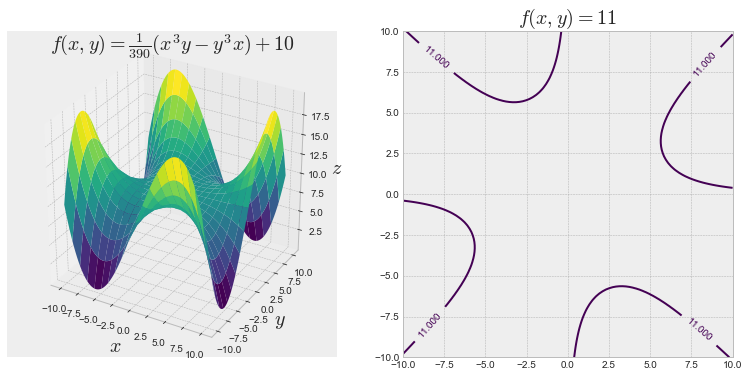

In [10]:
# 데이터 준비
x1 = x2 = np.linspace(-10,10,100)
X1, X2 = np.meshgrid(x1, x2)

Z = (1/390.)*(X1**3 * X2 - X2**3 * X1) + 10

fig = plt.figure()
fig.set_size_inches((13,6))

ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(X1, X2, Z, rstride=5, cstride=5, cmap=plt.cm.viridis, antialiased=True)
ax1.set_xlabel('$x$', fontsize=20)
ax1.set_ylabel('$y$', fontsize=20)
ax1.set_zlabel('$z$', fontsize=20)
ax1.set_title(r'$f(x,y)=\frac{1}{390}(x^3 y - y^{3}  x)+10$', fontsize=20)

ax2 = fig.add_subplot(122)
CS = ax2.contour(X1, X2, Z, levels=[11], cmap=plt.cm.viridis)
plt.clabel(CS, inline=True, fontsize=10)
ax2.set_title('$f(x,y)=11$', fontsize=20)

plt.show()
mpl.style.use(style_name)

- 만약 3변수 함수라면 어떻게 될까?
    - 3변수 스칼라 함수는 그래프를 그릴 수 없고, 한변이 숫자로 고정된 $f(x, y, z)=c$는 공간의 공면(일종의 껍질)로 나타남
    - level surface, iso-cost surface로 불리기도 함

#### 직선의 방정식

- 직선의 방정식을 1변수 실함수와 2변수 실함수의 관점에서 생각해보자.


<img src="imgs/linear-eq.png" width="700"/>


- js/plane.html 을 크롬으로 열고 a=2, b=1, c=-4로 맞춰보자.

- 위 그림에서 오른쪽 평면의 그래프는 $f(x,y) = 2x + y - 4$이고

- 오른쪽 직선의 그래프는 $y$절편이 4이고 기울기가 $-2$인 직선을 나타내고 있다. 
 
- 이 예를 통해 직선의 방정식과 평면의 방정식의 관계를 정리해보자.


- 일단 두 방정식을 다시 적어 보자.
    - 평면의 방정식(2변수 실함수) : $f(x,y) = 2x + y - 4$
    - 직선의 방정식(2변수 실함수의 음함수 형태) : $y = -2x + 4$


- $f(x,y)=0$으로 두고 정리하면

$$
\begin{aligned}
& 2x + y  -4 = 0 \\
& y = -2x +4
\end{aligned}
$$

- 즉 왼쪽 평면에서 함숫값이 0인 점들만 모은것이 직선의 방정식이 된다.



## 일변수-벡터함수univariable vector function

- 입력이 하나이고 출력이 여러 개인 함수로 출력이 3개라면 다음처럼 표현할 수 있다.

- $\mathbf{r}(t) = (x(t), y(t), z(t))$

- 평면 또는 공간에 존재하는 곡선, 시간에 따른 물체의 이동경로를 나타내는 함수로 활용

- $f\left(x(t), y(t), z(t) \right) = \left(\sin(6t), \frac{1}{4}t, \frac{t^2}{2} \right)^{\text{T}}$



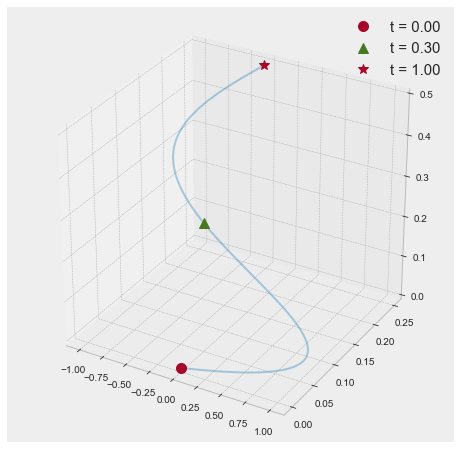

In [11]:
t = np.linspace(0, 1, 100)

x = np.sin(6*t)
y = 1/4 * t
z = t**2 / 2

fig = plt.figure()
fig.set_size_inches((8,8))

ax = fig.add_subplot(111, projection='3d')

ax.plot3D(x, y, z, alpha=0.4)
#ax.scatter(x, y, z, '.', alpha=0.4)
ax.plot([x[0]],  [y[0]],  [z[0]],  'o', markersize=10, color=style_colors[1], label="t = {:.2f}".format(t[0]))
ax.plot([x[60]], [y[60]], [z[60]], '^', markersize=10, color=style_colors[3], label="t = {:.2f}".format(t[30]))
ax.plot([x[-1]], [y[-1]], [z[-1]], '*', markersize=10, color=style_colors[1], label="t = {:.2f}".format(t[-1])) 

ax.legend(fontsize=15)

plt.show()

## 다변수-벡터함수multivariable vector function

- 변수 여러개가 입력되고 결과도 여러개가 출력되는 함수

- 아래는 변수 2개 입력, 출력 3개인 경우를 나타냄

$$
\mathbf{r}(u,v) = \left( x(u, v), y(u, v), z(u, v) \right)^{\text{T}} \qquad \mathbb{R}^2 \to \mathbb{R}^3
$$

- 예 : 파라메트릭 표현<sup>parametric representation</sup>으로 3차원에 존재하는 곡면<sup>[choi]</sup>

    - $\mathbf{r}(u,v) = (\cos u \sin v , \sin u \sin v , \cos v)^{\text{T}} \qquad 0 \le u \le 2\pi, \quad 0 \le v \le \pi$
    - $\mathbf{r}(t,s) = (2t , s, s^2 - t^2 +1)^{\text{T}} $




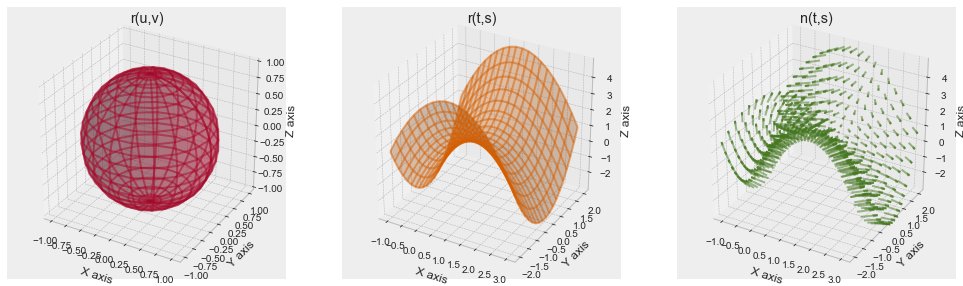

In [12]:
u = np.linspace(0, 2*np.pi, 20)
v = np.linspace(0, np.pi, 20)

# parametric vector valued vector function
U,V = np.meshgrid(u,v)
X = np.cos(U)*np.sin(V)
Y = np.sin(U)*np.sin(V)
Z = np.cos(V)

fig = plt.figure()
fig.set_size_inches((17,5))

ax1 = fig.add_subplot(131, projection='3d')

ax1.plot_surface(X,Y,Z,  alpha=0.3, color=style_colors[1])
ax1.plot_wireframe(X,Y,Z,  alpha=0.5, color=style_colors[1])
ax1.set_xlabel('X axis')
ax1.set_ylabel('Y axis')
ax1.set_zlabel('Z axis')
ax1.set_title('r(u,v)')

# unit vector field
t = np.linspace(-2, 2, 20)
s = np.linspace(-2, 2, 20)

T, S = np.meshgrid(t, s)
X, Y, Z = T+1, S, S**2-T**2+1
Nx, Ny, Nz = 2*T, -2*S, np.ones(T.shape) #법선 벡터장

ax2 = fig.add_subplot(132, projection='3d')
ax2.plot_surface(X,Y,Z, alpha=0.3, color=style_colors[4])
ax2.plot_wireframe(X,Y,Z, alpha=0.5, color=style_colors[4])
ax2.set_xlabel('X axis')
ax2.set_ylabel('Y axis')
ax2.set_zlabel('Z axis')
ax2.set_title('r(t,s)')

ax3 = fig.add_subplot(133, projection='3d')
ax3.quiver(X,Y,Z, Nx,Ny,Nz, length=0.5, normalize=True, color=style_colors[3], alpha=0.5)
ax3.set_xlabel('X axis')
ax3.set_ylabel('Y axis')
ax3.set_zlabel('Z axis')
ax3.set_title('n(t,s)')

plt.show()


### 소프트맥스 활성함수<sup>softmax activation function, [wiki: Softmax function]</sup> 

- 머신러닝에서 중요하게 활용되는 다변수-벡터 함수


<img src="imgs/softmax.png" width="700"/>

- 실수값 $K$개를 입력받아서 그에 대응하는 0과 1사이의 숫자 $K$개를 출력

$$
\begin{aligned}
\text{softmax} : \mathbb{R}^{K} \to [0,1]^{K} \\[5pt]
\text{softmax}(\mathbf{z})_j = \frac{e^{z_j}}{\sum_{k=1}^{K} e^{z_k}}
\end{aligned}
$$

- 입력값에 지수함수를 적용하고 더 더한 값으로 나눠서 노멀라이즈<sup>normalize</sup> 시킴

- 만들어진 결과는 다 더해서 1이 되므로 확률로 해석 가능

<img src="imgs/softmax-cost.png" width="700">

- 소프트맥스를 함수의 출력값에 적용했을 때 이상적으로는 정답자리만 1이고 나머지는 모두 0이 되어야 함.

- 따라서 정답자리가 커지면 나머지 오답자리는 줄어든다.

- 이런 성질 때문에 잘했는지 못했는지에 대한 평가는 정답자리의 $-\log()$값만 사용하면 됨

In [13]:
# 소프트맥스 함수 동작 실험

z = np.array([1.0, 2.5, 3.0, 2.0])
exp_z = np.exp(z)
print("input vector z : {}".format(z))

sum_exp_z = exp_z.sum()
print("sum exp(z)     : {}".format(sum_exp_z))

softmax = exp_z / sum_exp_z
print("softmax(z)     : {}".format(softmax))
print("sum softmax(z) : {:.2f}".format(softmax.sum()))

input vector z : [1.  2.5 3.  2. ]
sum exp(z)     : 42.375368811280836
softmax(z)     : [0.0641 0.2875 0.474  0.1744]
sum softmax(z) : 1.00


## 참고문헌

1. [wiki:음함수,양함수] https://ko.wikipedia.org/wiki/음함수와_양함수

1. [jakevdp] Density and Contour Plots, https://jakevdp.github.io/PythonDataScienceHandbook/04.04-density-and-contour-plots.html

1. [choi] Surface Modeling for CAD/CAM - Advanced in Industrial Engineering, Byoung K. Choi, Elsevier

1. [wiki: Softmax function] https://en.wikipedia.org/wiki/Softmax_function



In [ ]:
from IPython.core.display import HTML

def _set_css_style(css_file_path):
   """
   Read the custom CSS file and load it into Jupyter.
   Pass the file path to the CSS file.
   """
   styles = open(css_file_path, "r").read()
   s = '<style>%s</style>' % styles     
   return HTML(s)

_set_css_style("../style.css")